<a href="https://colab.research.google.com/github/PavanBhat007/Learning-ML/blob/main/DCGANs_using_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Creating anime characters using Deep Convolutional Generative Adversarial Networks (DCGANs) and PyTorch**
###### https://cognitiveclass.ai/courses/course-v1:IBM+GPXX0A52EN+v1

# **GANs (Generative Adversarial Networks)**
- GANs are a class of machine learning frameworks, first published in June 2014.

- GANs can **generate new data that follows the statistical features of the data in the training set**. GANs are widely used to generate new and realistic photographs that are authentic to human observers.

- Convolutional networks (CNNs) has seen huge adoption in computer vision applications. **Applying the CNNs to GANs models** could help us in building a photo generating model.

- The combined method is called **Deep Convolutional Generative Adversarial Networks (DCGANs).**

We will be creating anime characters like below in this project:
<img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0XCEEN/images/face_cartton.png" width="700" alt="Skills Network Logo">

In [1]:
!pip install skillsnetwork

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.3 MB/s eta 0:00:00


In [2]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.distributions.multivariate_normal import MultivariateNormal
from torch.optim import lr_scheduler
from tqdm import tqdm
from IPython import display

import torchvision.utils as vutils
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image
from torchvision.transforms import ToPILImage


import os
from os import listdir
from pathlib import Path
import imghdr
import skillsnetwork

Getting pre-trained Generator modelm that is trained on 63.6K images from Kaggle - Anime Face Dataset

In [3]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0A52EN/G_trained.pth
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0A52EN/D_trained.pth

--2023-10-01 05:25:19--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0A52EN/G_trained.pth
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15238089 (15M) [binary/octet-stream]
Saving to: ‘G_trained.pth’

G_trained.pth       100%[===================>]  14.53M  3.23MB/s    in 5.6s    

2023-10-01 05:25:26 (2.59 MB/s) - ‘G_trained.pth’ saved [15238089/15238089]

--2023-10-01 05:25:26--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0A52EN/D_trained.pth
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf

## **Helper/Utility functions**

In [4]:
# This function will allow us to easily plot data taking in x values, y values, and a title
def plot_distribution(real_data,generated_data,discriminator=None,density=True):

  # histogram plot of real data and generated data from generator model
  plt.hist(real_data.numpy(), 100, density=density, facecolor='g', alpha=0.75, label='real data')
  plt.hist(generated_data.numpy(), 100, density=density, facecolor='r', alpha=0.75,label='generated data q(z) ')

  # discriminator is used to "discriminate"/distinguish between real and generated data
  if discriminator:
    max_ = torch.max(real_data.max(), generated_data.max().detach()) # maximum value
    min_ = torch.min(real_data.min(), generated_data.min().detach()) # minimum value
    x = torch.linspace(start=min_, end=max_, steps=100) # range from minimum to maximum

    # Applying the discriminator to these input values using discriminator(x.view(-1,1)) to get the discriminator's output.
    # The .detach() method is used to prevent backpropagation from affecting the discriminator.
    plt.plot(x.numpy(), discriminator(x.view(-1,1)).detach().view(-1).numpy(), label='discriminator', color='k')

    # A horizontal line at y = 0.5 is also plotted in blue ('b').
    # This line represents the decision boundary of the discriminator,
    # where values above 0.5 are classified as real, and values below 0.5 are classified as generated.
    plt.plot(x.numpy(), 0.5*np.ones(x.shape), label='0.5',color='b')
    plt.legend()
    plt.show()

In [5]:
# plot batch of images
# my_batch is a tensor-like object (e.g., a PyTorch tensor) containing a batch of image data.
def plot_image_batch(my_batch):

  fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(10, 10))

  # iterating through the images
  img_num=0
  for i in range(8):
    for j in range(8):
      ax = axes[i][j]
      img_num+=1

      # [my_batch[img_num].to(device)]: It retrieves the image data from my_batch using indexing (my_batch[img_num]) and sends it to the device (assuming device is defined elsewhere in the code).
      # [vutils.make_grid(my_batch[img_num].to(device), padding=2, normalize=True)] : It uses vutils.make_grid to create a grid of images, with optional padding and normalization applied.
        # The resulting grid is a tensor.
      # [np.transpose(vutils.make_grid(...))] : It transposes the grid using np.transpose to change the order of dimensions so that it's suitable for displaying with imshow.
        # The order of dimensions is changed from (C, H, W) to (H, W, C) to match the format expected by imshow.
      # [ax.imshow(np.transpose(...))]: It displays the image on the current subplot (ax) using ax.imshow.
      ax.imshow(np.transpose(vutils.make_grid(my_batch[img_num].to(device), padding=2, normalize=True).cpu(),(1,2,0)))
  plt.show()

In [6]:
def get_accuracy(X,Xhat):
  total = 0
  py_x = D(X)
  total = py_x.mean()
  py_x = D(Xhat)
  total += py_x.mean()
  return total/2

In GANs, **discriminator and generator continuously improve** through a well-formulated **cost function that backpropagates the errors**. GANs are a family of algorithms that use **learning by comparison**.

Consider the following data, $\mathbf{x}$, that is normally distributed, $\mathbf{x} \sim \mathcal{N}(\mathbf{x}|10,0.1)$, with a mean of 10 and a standard deviation of 0.1. Now, we would like to randomly sample data from this distribution.

In [7]:
class Dataset(Dataset):
  def __init__(self, covariance_matrix, mean, n_samples=1000):
    self.obj = MultivariateNormal(loc=mean, covariance_matrix=covariance_matrix)
    self.mean = mean

    # Covariance matrix: [i,j] element is the covariance between the i-th and j-th elements of a random vector.
    self.covariance_matrix = covariance_matrix

    # A loop generates "n_samples" samples from the multivariate normal distribution and stores them in a tensor "self.X".
    # Each sample is enclosed in a list, and the resulting tensor has a shape of "(n_samples, 1, num_features)",
    # where "num_features" is the dimensionality of the multivariate normal distribution.
    self.X = torch.tensor([[self.obj.sample()] for n in range(n_samples)])

  # returns length of random sample data
  def __len__(self):
    return len(self.X)

  # returns part of ransom sample data from "idx" to end
  def __getitem__(self, idx):
    return self.X[idx,:]

## **Multivariate Normal Distributions**
A multivariate normal distribution, often referred to as a multivariate Gaussian distribution, is a probability distribution that generalizes the univariate (single-variable) normal distribution to multiple variables. In a multivariate normal distribution, you have a vector of random variables, each of which follows a normal (Gaussian) distribution.

- **Multivariate Random Variables**: In a multivariate normal distribution, you have a **set of random variables**, typically represented as a vector. For example, if you have two random variables, you would represent them as a vector $\mathbf{X}$ = [$\mathbf{X}$<sub>1</sub> , $\mathbf{X}$ <sub>2</sub>]

<br>

- **Mean Vector** ($μ$): The mean vector, denoted as μ, specifies the **expected value of each random variable** in the vector.
  - It represents the **center or the location of the distribution**.

<br>

- **Covariance Matrix** ($Σ$): The covariance matrix, denoted as $Σ$, describes **how the random variables in the vector are correlated** with each other.
  - It provides information about the **strength and direction of linear relationships** between variables.
  - A **diagonal element of the covariance matrix represents the variance of a single variable**, while **off-diagonal elements represent the covariances between pairs of variables.**
  - If **all off-diagonal elements** of the covariance matrix are **zero**, it indicates that the **random variables are independent**, and the multivariate normal distribution simplifies into a set of univariate normal distributions.

<br>

- **Probability Density Function (PDF)**: describes the likelihood of observing specific vector of values.
$$
f(\mathbf{x}| \boldsymbol{\mu}, \boldsymbol{\Sigma}) = \frac{1}{\sqrt{(2\pi)^k |\boldsymbol{\Sigma}|}} \exp\left(-\frac{1}{2}(\mathbf{x} - \boldsymbol{\mu})^\top \boldsymbol{\Sigma}^{-1} (\mathbf{x} - \boldsymbol{\mu})\right)
$$
where,
  - k is the dimensionality (number of variables) of the multivariate distribution.
  - x is the vector of observed values.
  - μ is the mean vector.
  - Σ is the covariance matrix.



In [8]:
n_samples = 10000
mean = 10*torch.ones(1) # 10 * Matrix with all elements as 1
covariance_matrix = 0.1*torch.eye(1) # 0.1 * Identity matrix

dataset = Dataset(covariance_matrix=covariance_matrix, mean=mean, n_samples=n_samples)

We also have the data sample, z, which is also normally distributed $\mathbf{z} \sim \mathcal{N}(\mathbf{z}|0,1) $, with mean of 0 and a standard deviation of 2:

In [9]:
Z=torch.randn(n_samples,1)

In [10]:
print("mean:",Z.mean())
print("standard deviation:",Z.std())

mean: tensor(0.0027)
standard deviation: tensor(0.9954)


Comparing the two distributions:

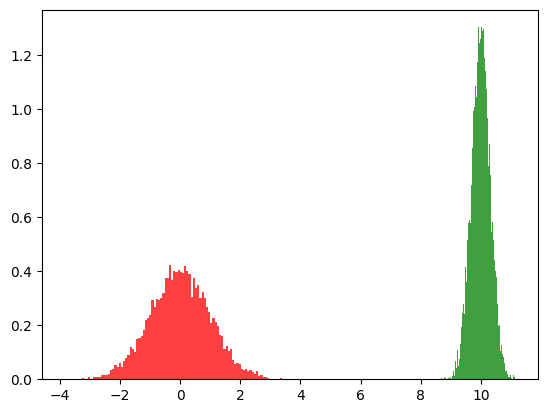

In [11]:
plot_distribution(real_data=dataset.X,generated_data=Z)

As seen in above plot,
- RED: Data sample Z, which has mean of 0 (centered around 0) and Standard deviation of 2
- GREEN: Data sample X, which has mean of 10 (centered around 10) and Standard deviation of 0.1

Let's create our first generative model by adding 10 to every sample of $z$. We will call the result $\hat{\mathbf{x}}$  as it's an approximation of $\mathbf{x}$. It ican be shown that $\hat{\mathbf{x}} \sim \mathcal{N}(\mathbf{x}|10,1)$


In [12]:
Xhat = Z+10

In [13]:
print("mean:",Xhat.mean())
print("standard deviation:",Xhat.std())

mean: tensor(10.0027)
standard deviation: tensor(0.9954)


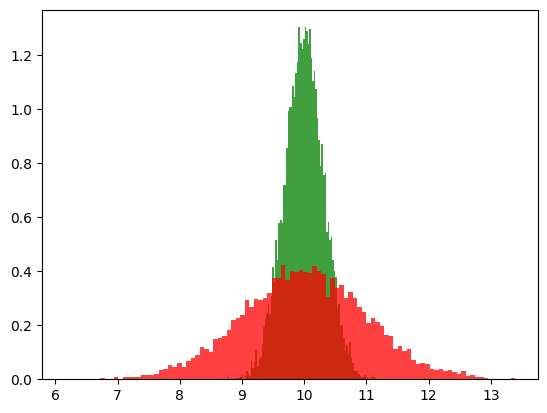

In [14]:
plot_distribution(real_data=dataset.X,generated_data=Xhat)

Now we can see that the mean and SD (Standard Deviation) has been adjusted and now both Xhat and X are centered around $mean = 10$

In the given scenario, by simply adding 10 to the latent variable 𝑧, we are transforming it using a deterministic function.<br>
Consequently, this type of generative model can be referred to as an **implicit generative model.**

## **Understanding GAN**

There are two networks involved in a GAN, the **Generator and the Discriminator.** Let's understand the Generator network first.

### **The Generator**
The Generator is a neural network denoted by $G$; the idea is that a neural network can approximate any function (by the [Universal Approximation Theorem](https://en.wikipedia.org/wiki/Universal_approximation_theorem?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0A52EN3517-2023-01-01)), so you should be able to generate data samples from any type of distribution.

Our goal is to **convert the samples, $\mathbf{z}$, to one that approximates $\hat{\mathbf{x}}$,  i.e $\hat{\mathbf{x}}=G(\mathbf{z})$.** Let's build a simple Generator $G(\mathbf{z})=\mathbf{W}^{T}\mathbf{z}+\mathbf{b} $ using PyTorch.

The following is a function that outputs a generator using PyTorch model object.


In [15]:
# Simple generator class in PyTorch, which is a basic feedforward neural network.
# Generator inherits from nn.Module, which is the base class for all PyTorch models
class Generator(nn.Module):
  # "input_dim = 1" => expects 1-dimensional input
  def __init__(self, input_dim=1):

    # The superclass constructor (super(Generator, self).__init__()) initializes the Generator class as a PyTorch module.
    super(Generator, self).__init__()
    # Defining a single fully connected layer using nn.Linear
    self.l1 = nn.Linear(1, input_dim)

  # The forward method is implemented to specify how the input data should be processed through the neural network.
  # In this case, it's a very simple forward pass:
    # It takes an input tensor x.
    # It passes x through the single linear layer self.l1 using self.l1(x).
    # The result of this operation is returned as the output of the generator.
  def forward(self, x):
    return self.l1(x)

G = Generator()

We can utilize the Generator to transform $\mathbf{z}$ and generate a prediction $\hat{\mathbf{x}}$. By comparing the histograms of the distributions of $\hat{\mathbf{x}}$ and $\mathbf{x}$, we can observe notable disparities since the model is untrained.


### **The Discriminator**
The discriminator, denoted as  𝐷(𝐱), is a **neural network that is trained to differentiate between real and generated samples**.

In its simplest form, the discriminator can be implemented as a **logistic regression function.** To create a discriminator using Keras, we can utilize a **single Dense layer**.

The **logistic function, which is used to determine the probability of the sample being real or generated, will be incorporated in the cost function**. This approach follows the convention typically followed in PyTorch.

In [16]:
# Simple discriminator class in PyTorch, which is a basic feedforward neural network.
# Generator inherits from nn.Module, which is the base class for all PyTorch models
class Discriminator(nn.Module):
  # "input_dim = 1" => expects 1-dimensional input
  def __init__(self,input_dim=1):

    # The superclass constructor (super(Discriminator, self).__init__()) initializes the Discriminator class as a PyTorch module.
    super(Discriminator,self).__init__()
    # Defining a single fully connected layer using nn.Linear
    self.l1 = nn.Linear(1,input_dim)

  # The forward method is implemented to specify how the input data should be processed through the neural network.
  # In this case, it's a very simple forward pass:
    # It takes an input tensor x.
    # It passes x through the single linear layer self.l1 using self.l1(x).
    # The result of this operation is passed through a sigmoid activation function using torch.sigmoid(self.l1(x)).
    # This is common in discriminative models, where the output is often interpreted as a probability.
  def forward(self, x):
    return torch.sigmoid(self.l1(x))

D = Discriminator()

In [17]:
G

Generator(
  (l1): Linear(in_features=1, out_features=1, bias=True)
)

In [18]:
D

Discriminator(
  (l1): Linear(in_features=1, out_features=1, bias=True)
)

The discriminator and generator are randomly initialized, but we can plot the output of each and compare it to the true data distribution.

<br>

In the plot,
- the **generated data is represented in red, while the real data is represented in green.**
- The **logistic function** is used as a function of the **x-axis**. Additionally, we include a threshold value.
- If the output of the logistic function is **less than 0.5**, the sample is classified as **generated data**. Conversely, if the output is **greater than 0.5**, the sample is classified as **data that came from the real dataset**.


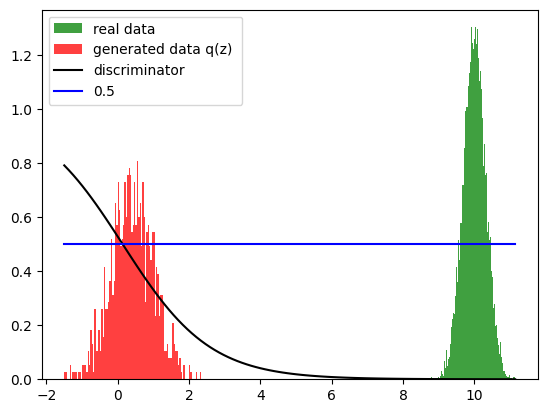

In [19]:
n_samples = 1000
Xhat = G(torch.randn(n_samples,1))
plot_distribution(real_data=dataset.X,generated_data=Xhat.detach(),discriminator=D)

Applying the sigmoid function to the discriminator output, we obtain probabilities indicating whether the samples belong to the real distribution. By setting a threshold of 0.5, we can determine the discriminator's classification for each sample.

As seen above, the red plot is mostly below the blue (0.5) line, stating that the discriminator classified all those samples as "generated data".

In [20]:
py_x = D(dataset.X)
torch.sum(py_x>0.5)/len(py_x)

tensor(0.)

Discriminator gives 1 on real dataset => ALL of the values are > 0.5 => data from real dataset

While applying on the random samples,

In [21]:
py_x = D(Z)
torch.sum(py_x>0.5)/len(py_x)

tensor(0.5551)

In [22]:
D(dataset.X)

tensor([[0.0003],
        [0.0003],
        [0.0005],
        ...,
        [0.0004],
        [0.0003],
        [0.0004]], grad_fn=<SigmoidBackward0>)

In [23]:
D(Z)

tensor([[0.3751],
        [0.8675],
        [0.6102],
        ...,
        [0.1484],
        [0.6742],
        [0.6006]], grad_fn=<SigmoidBackward0>)

In [24]:
get_accuracy(dataset.X,Xhat)

tensor(0.2239, grad_fn=<DivBackward0>)

## **The Loss Function GANs**
GANs convert an unsupervised learning problem to a supervised one. Instead of formulating the problem like a two-player minimax game with a value function, we can treat the problem of maximizing the familiar log-likelihood of the logistic function analogous to minimizing the cross-entropy loss, then incorporate the generator and discriminator.

<br>

___Discriminator___

In order to train the GANS, we start off with standard maximization of the likelihood for the discriminator for the standard dataset $\mathcal{D}=\{{(x_1, y_1), ..., (x_N, y_N)}\}$:

$$V(D)=\sum_{n=1}^N \left( y_n \ln(D(\mathbf{x}_n))+(1-y_n) \ln(1-D(\mathbf{x}_n))\right)$$

Where $y=1$ for samples from the true distribution and $y=0$ for samples from the generator. The goal is to maximize this term with respect to $D$:

$$max_{D}(V(D))$$


To also incorporate the generated samples, we augment the right side of the equation with the generated $k$th sample $\hat{\mathbf{x}}_k$. As they are not part of the dataset $k \notin \mathcal{D} $, we have to include a second summation where $y=0$. Finally, combining the cases of $y=1$ and $y=0$, we get:

$$V(D)=\sum_{ n	\in \mathcal{D}}  \ln(D(\mathbf{x}_n))+\sum_{k 	\notin \mathcal{D}} \ln(1-D(\hat{\mathbf{x}}_k) ) $$


___Generator___

For the generator we simply replace $\hat{\mathbf{x}}_k$ with the $G(\mathbf{z}_k)$ .


$$V(G,D)=\sum_{n	\in \mathcal{D}} \ln(D(\mathbf{x}_n))+\sum_{k 	\notin \mathcal{D}} \ln(1-D(G(\mathbf{z}_k))) $$

As this is a density estimation problem, it is common to replace the summation with the expected value. We replace the summations with an expectation where $p(\mathbf{x})$ is the true distribution and $p(\mathbf{z})$ is the distribution of $\mathbf{z}$.


$$V(D,G)=\mathbb{E}_{x\sim p(\mathbf{x})} \ln(D(\mathbf{x})) + \mathbb{E}_{\mathbf{z} \sim p(\mathbf{z})} \ln(1-D(G(\mathbf{z}) )) $$

As we are trying to trick the discriminator, we would like to find a $G$ that minimize the above expression, such as:

$$min_{G} max_{D} V(D,G)$$


## **Training**

### ___Training Generator___

$log(1 − D(G(\mathbf{z})))$ is difficult to work with as $D(G(\mathbf{z}))$ is near one or zero for the first few iterations. This is because the generator is not yet properly trained, and the discriminator can easily distinguish between the generated and actual samples. Therefore we maximize $log(D(G(\mathbf{z}_k)) )$.

Although the output of the generator passes through the discriminator, we do not update the generator in the optimization step, hence we set the parameter **```training=False```** in the actual training steps.

Instead of maximizing the term, we can take the negative and minimize it. The resultant expression can be calculated in PyTorch using the cross-entropy loss where all the target values are set to one:

$$\sum_{k 	\notin \mathcal{D}} log(1 - D(G(\mathbf{z}_k)) )$$

We start off eith the ```nn.BCELoss()```



In [25]:
criterion=nn.BCELoss()

In [26]:
criterion(D(G(Z)),torch.zeros(Z.shape[0],1))

tensor(0.6088, grad_fn=<BinaryCrossEntropyBackward0>)

### ___Training Discriminator___

We can also use the cross-entropy to train the discriminator; we simply multiply $V(G,D)$ by a negative number, set $y=0$ for the generated values and $y=1$ for the real values. We do not update the generator parameters.

$$V(G)=\sum_{n	\in \mathcal{D}} (\ln(D(\mathbf{x}_n)))+\sum_{k 	\notin \mathcal{D}} \ln(1-D(G(\mathbf{z}_k) )) $$


The first term is the real loss and the second is the fake loss in PyTorch.

In [27]:
criterion(D(dataset.X),torch.ones(len(dataset),1))+criterion(D(G(Z)),torch.zeros(Z.shape[0],1))/2

tensor(8.3593, grad_fn=<AddBackward0>)

Creating the optimizer for the discriminator and generator:

In [28]:
# Learning rate for optimizers
lr = 0.1

# Beta1 hyperparam for Adam optimizers
beta1 = 0.1

G = Generator()
D = Discriminator()

optimizerG = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))

We now train the model; as the dataset is small, we will use batch gradient descent.

For each iteration we will generate $M$ real examples $\{\mathbf{x}_{1}, ...,\mathbf{x}_{M}\}$, these are from the generating distribution $p(\mathbf{x})$. This would be our actual dataset if we used real data.  

We will then generate a sample batch of $M$ noise samples $\{\mathbf{z}_{1}, ...,\mathbf{z}_{M}\}$ from noise prior $p(\mathbf{z})$ and convert the result to a generated image using the generator $\{\hat{\mathbf{x}}_{1}, ...,\hat{\mathbf{x}}_{M}\}$.

We determine the output of the discriminator for both the real and generated samples. We calculate the loss and then update the discriminator and generator through their respective stochastic gradients.


In [29]:
batch_size=100

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

  0%|          | 0/20 [00:00<?, ?it/s]

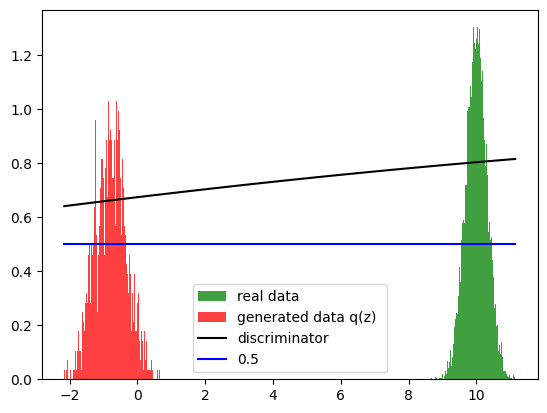

  5%|▌         | 1/20 [00:01<00:33,  1.74s/it]

Epoch: 0


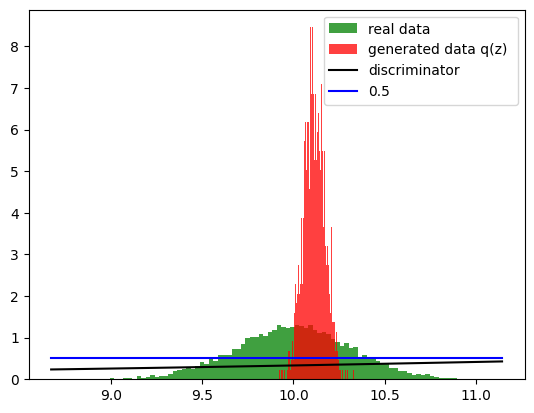

 10%|█         | 2/20 [00:03<00:29,  1.62s/it]

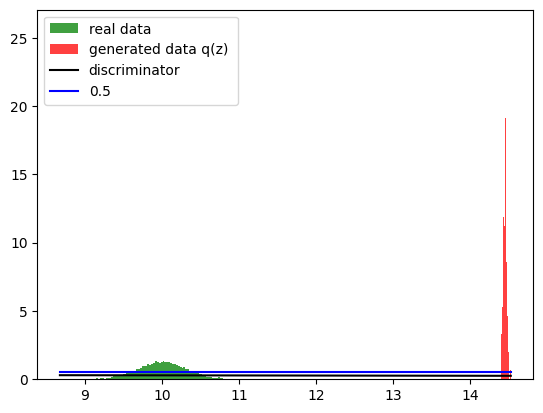

 15%|█▌        | 3/20 [00:04<00:27,  1.60s/it]

Epoch: 2


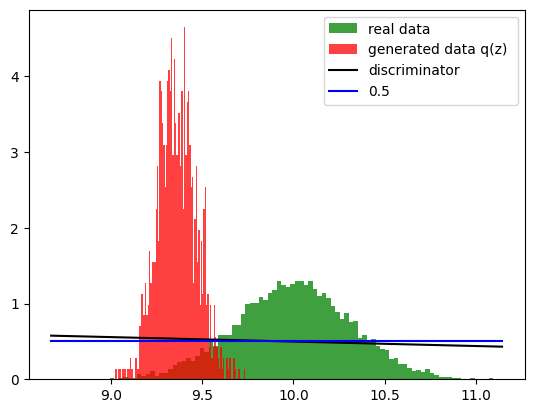

 20%|██        | 4/20 [00:06<00:24,  1.56s/it]

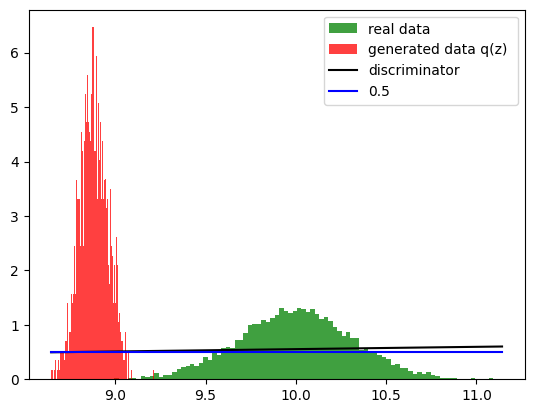

 25%|██▌       | 5/20 [00:10<00:35,  2.38s/it]

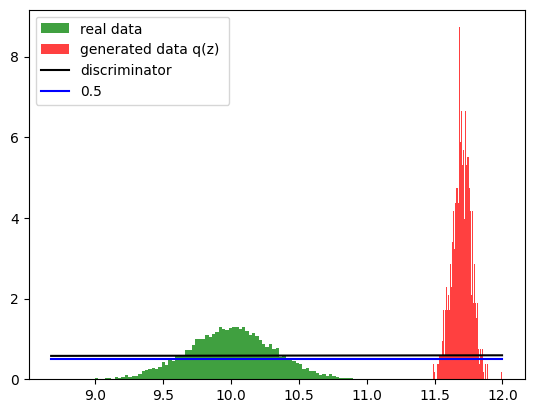

 30%|███       | 6/20 [00:12<00:33,  2.39s/it]

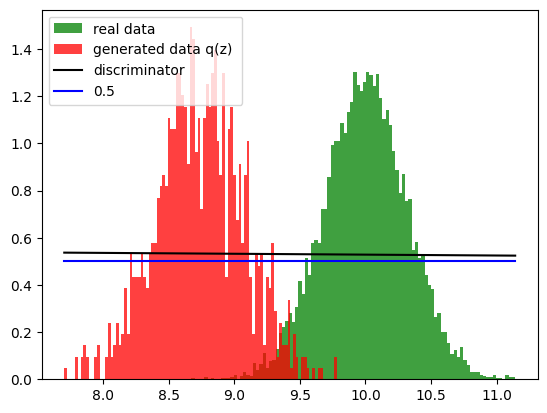

 35%|███▌      | 7/20 [00:15<00:33,  2.58s/it]

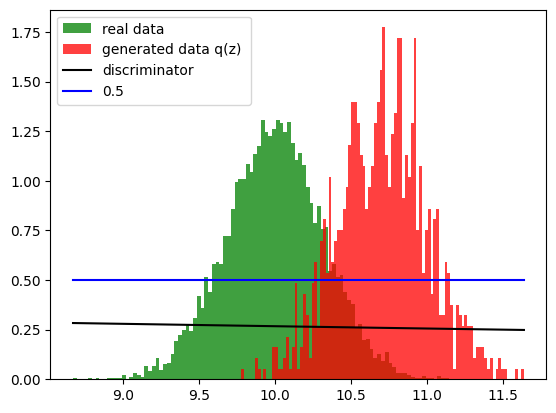

 40%|████      | 8/20 [00:18<00:32,  2.75s/it]

Epoch: 7


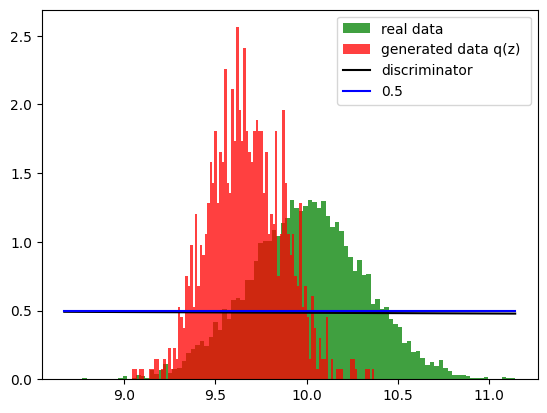

 45%|████▌     | 9/20 [00:22<00:34,  3.16s/it]

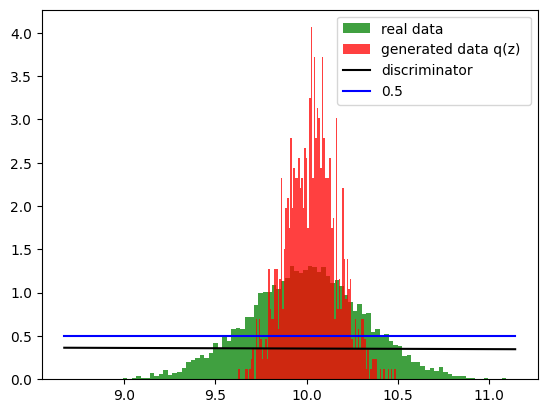

 50%|█████     | 10/20 [00:24<00:25,  2.58s/it]

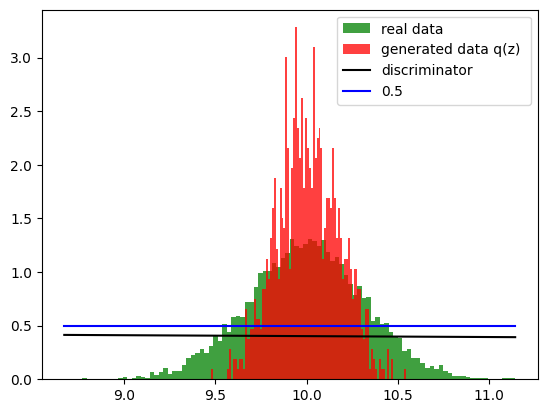

 55%|█████▌    | 11/20 [00:24<00:18,  2.03s/it]

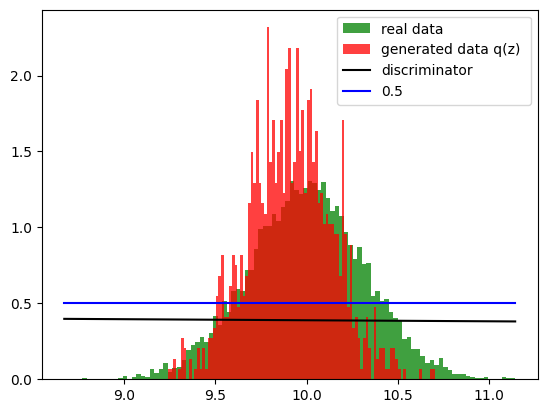

 60%|██████    | 12/20 [00:25<00:13,  1.66s/it]

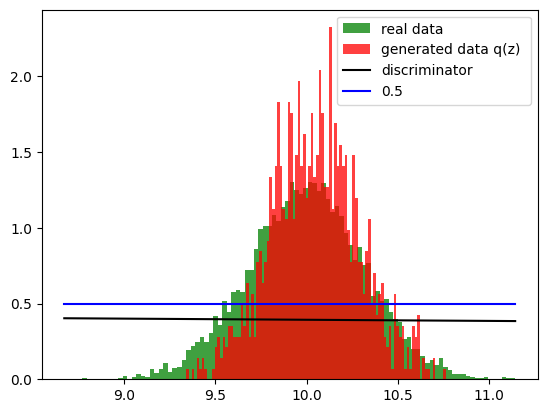

 65%|██████▌   | 13/20 [00:26<00:09,  1.39s/it]

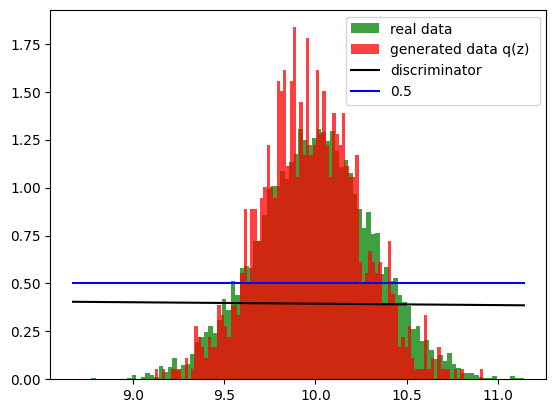

 70%|███████   | 14/20 [00:27<00:07,  1.28s/it]

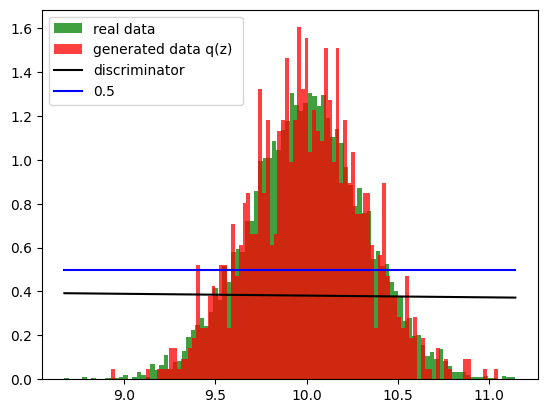

 75%|███████▌  | 15/20 [00:28<00:05,  1.13s/it]

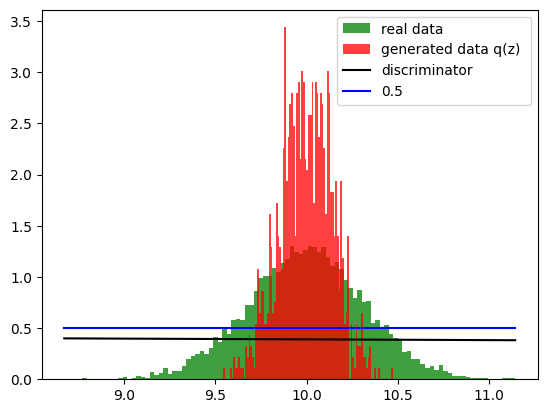

 80%|████████  | 16/20 [00:28<00:04,  1.03s/it]

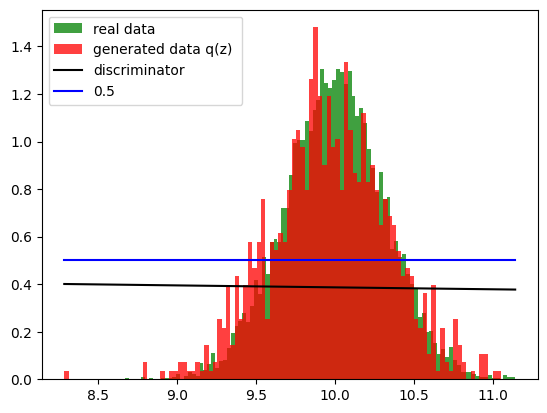

 85%|████████▌ | 17/20 [00:29<00:02,  1.04it/s]

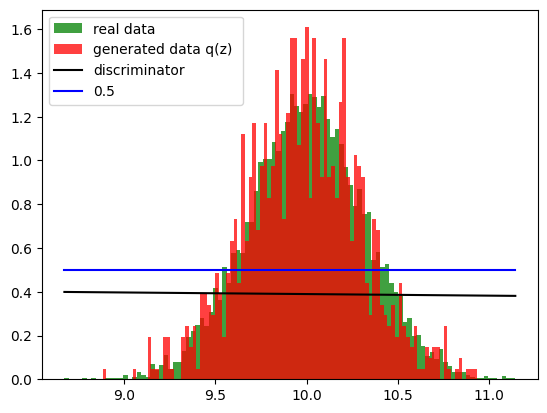

 90%|█████████ | 18/20 [00:30<00:01,  1.10it/s]

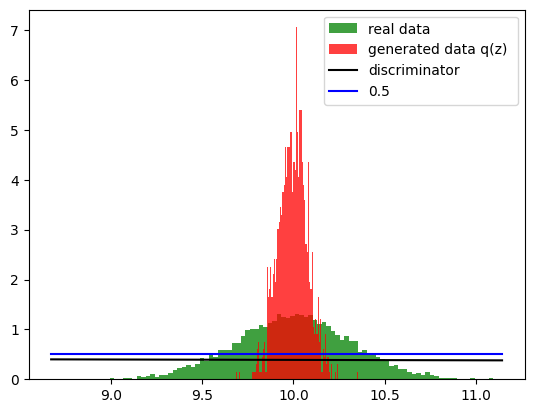

 95%|█████████▌| 19/20 [00:31<00:00,  1.08it/s]

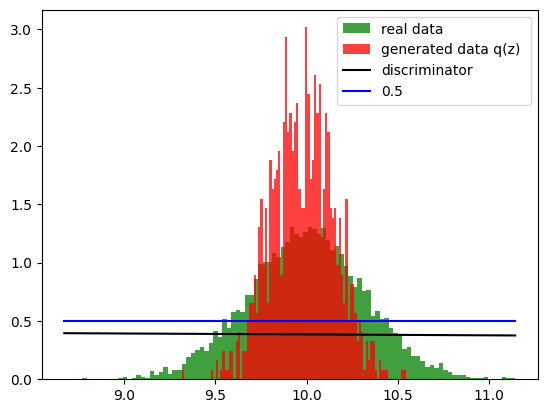

100%|██████████| 20/20 [00:32<00:00,  1.62s/it]


In [30]:
LOSS_G=[]
LOSS_D=[]

epochs=20

noise_dim=1
epsilon=100

# Training loop
for epoch in tqdm(range(epochs)):
    # Plot the data distribution and generated samples
    Xhat=G(torch.randn(n_samples,1))
    plot_distribution(real_data=dataset.X, generated_data=Xhat.detach(), discriminator=D)

    # Training the discriminator
    for real_data in dataloader:
        noise = torch.randn(batch_size, 1)
        fake_data = G(noise)

        # Discriminator predictions for real and fake data
        real_predictions = D(real_data)
        fake_predictions = D(fake_data)

        # Discriminator loss for real and fake data
        loss_D_real = criterion(real_predictions, torch.ones(batch_size, 1))
        loss_D_fake = criterion(fake_predictions, torch.zeros(batch_size, 1))

        # Overall discriminator loss
        loss_D = (loss_D_fake + loss_D_real) / 2
        LOSS_D.append(loss_D.detach().item())

        # Backpropagation and optimizer update for discriminator
        D.zero_grad()
        loss_D.backward(retain_graph=True)
        optimizerD.step()

        # Training the generator
        output = D(fake_data)
        loss_G = criterion(output, torch.ones(batch_size, 1))
        LOSS_G.append(loss_G.detach().item())

        # Backpropagation and optimizer update for generator
        G.zero_grad()
        loss_G.backward()
        optimizerG.step()

    # Save and display the generator and discriminator if the performance increases
    Xhat = G(torch.randn(len(dataset), 1))
    accuracy = abs(0.5 - get_accuracy(dataset.X, Xhat))
    if accuracy < epsilon:
        epsilon = accuracy
        torch.save(D.state_dict(), 'D.pth')
        torch.save(G.state_dict(), 'G.pth')
        print("Epoch:", epoch)

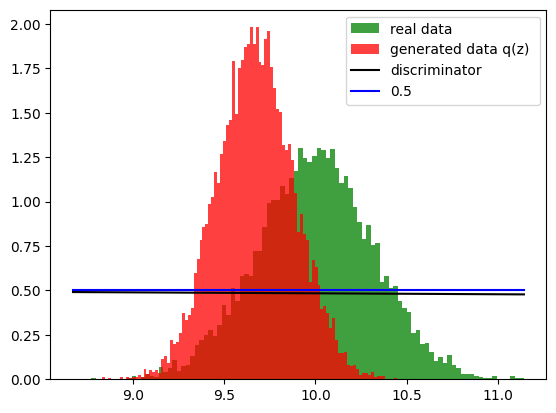

In [31]:
D=Discriminator()
D.load_state_dict(torch.load("D.pth"))
G=Generator()
G.load_state_dict(torch.load("G.pth"))

Xhat=G(torch.randn(len(dataset), 1))
plot_distribution(real_data=dataset.X, generated_data=Xhat.detach(), discriminator=D)

<br><hr><br>

# **Deep Convolutional Generative Adversarial Networks (DCGANs)**


use a DCGANs to create each character (unique anime avatar).

The proposed approaches are summarized here:

- Replace any pooling layers with **strided convolutions (discriminator)** and **fractional-strided
convolutions (generator)**.
- Use **batchnorm** in both the generator and the discriminator.
- **Remove fully connected hidden layers** for deeper architectures.
- Use **ReLU** activation in generator for all layers except for the output, which uses **Tanh**.
- Use **LeakyReLU** activation in the discriminator for all layers except for the output, which uses **Sigmoid**.
- Use **Adam optimizer**.  

These approaches will result in more stable training of deeper generative models.

## **Loading the Dataset**

We will mainly work with the Anime Face dataset from [Kaggle](https://www.kaggle.com/datasets/splcher/animefacedataset?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0A52EN3517-2023-01-01). The original dataset has 63,632 "high-quality" anime faces, but to make the models train faster in this lab, we randomly sampled 20,000 images and prepared a dataset called `cartoon_20000`.

Let's download the smaller dataset using the Skills Network library's `prepare` function:


In [32]:
dataset_url="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/labs/Module6/cartoon_20000.zip"
await skillsnetwork.prepare(dataset_url, overwrite=True)

  0%|          | 0/20001 [00:00<?, ?it/s]

Saved to '.'


Anime Face or Cartoon images are stored in the `cartoon_2000 folder`, which is assumed to be in the current working directory. As a preprocessing step, any files in the folder that are not in proper image format (based on the file extensions) have been removed. Additionally, any duplicate images have also been eliminated.


## **Creating the Data Generator**


In [33]:
img_height, img_width, batch_size = 64, 64, 128

Creating dataset class and object for images

In [34]:
current_directory = os.getcwd() # os.current_working_directory()
directory = os.path.join(current_directory ,'cartoon_20000')
[filename for filename in os.listdir(directory) if filename.endswith('.jpg') ] # including .jpg files only


class Dataset(Dataset):
  def __init__(self, transform=None):
    current_directory = os.getcwd()
    directory = os.path.join(current_directory ,'cartoon_20000')

    self.file_paths = [os.path.join(directory,filename ) for filename in os.listdir(directory) if filename.endswith('.jpg') ]
    self.transform = transform

  def __len__(self):
      return len(self.file_paths)

  def __getitem__(self, index):
      image_path = self.file_paths[index]
      image = Image.open(image_path)

      if self.transform:
          image = self.transform(image)

      return image

In [35]:
dataset=Dataset()

Plotting some of the images

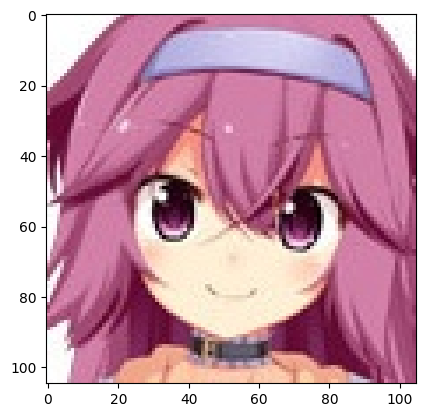

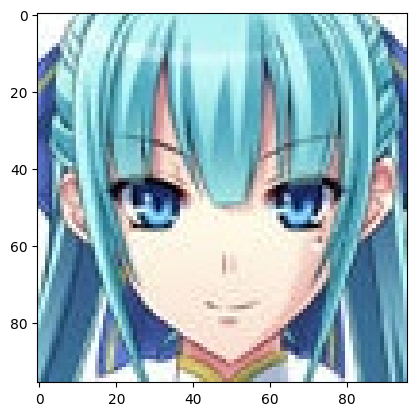

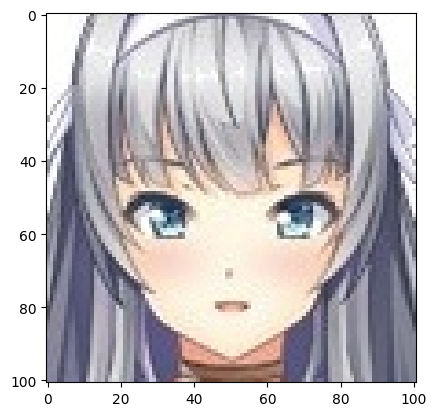

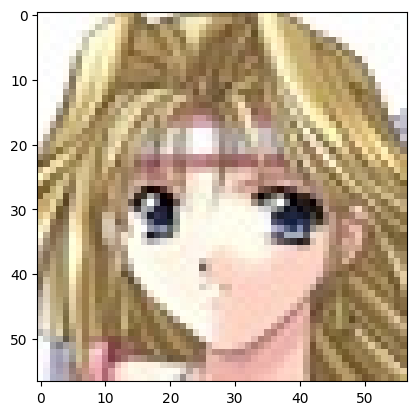

In [36]:
for i in range(1,5):
  plt.imshow(dataset[i])
  plt.show()

## **Data Augmentation**
Data augmentation is a widely used technique in machine learning, including for GANs, where **existing data is modified or transformed to create additional samples with increased diversity**. In GANs, data augmentation involves applying transformations to both real data and generated samples to introduce variations and enhance the model's ability to capture different aspects of the underlying data distribution.

By augmenting the real data, the GAN model is exposed to a wider range of variations, enabling it to learn more robust representations and generate more diverse outputs. Similarly, augmenting the generated samples helps make them more realistic and diverse, avoiding mode collapse. By incorporating random transformations during training, data augmentation in GANs enhances the training data, leading to improved performance and generalization capabilities of the model.

The following code resizes the image to the specified image_size, ensuring its dimensions match. Then, it is center-cropped to the same image_size, which helps remove any unwanted background or padding. After that, the image is converted to a tensor, which is the expected format for most deep learning models. Lastly, the pixel values are normalized using the specified mean and standard deviation (0.5, 0.5, 0.5) to (0.5, 0.5, 0.5), bringing them into the range of [-1, 1].

In [37]:
image_size = 64
transform=transforms.Compose([
                transforms.Resize((img_height, img_width)),
                transforms.ToTensor(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
              ])

Creating a dataset object and passing the transform object as an argument. This ensures that the defined transformations, such as resizing, cropping, converting to a tensor, and normalizing, are applied to each data sample in the dataset.

In [38]:
dataset=Dataset(transform=transform)

In [39]:
# Create the dataloader
# batch_size Batch size during training
batch_size = 128
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,shuffle=True)

Deciding which device to run on

In [40]:
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")
device

device(type='cpu')

Taking one batch of images for displaying

In [41]:
real_batch = next(iter(dataloader))
real_batch.shape

torch.Size([128, 3, 64, 64])

We can then plot 64 images from the batch

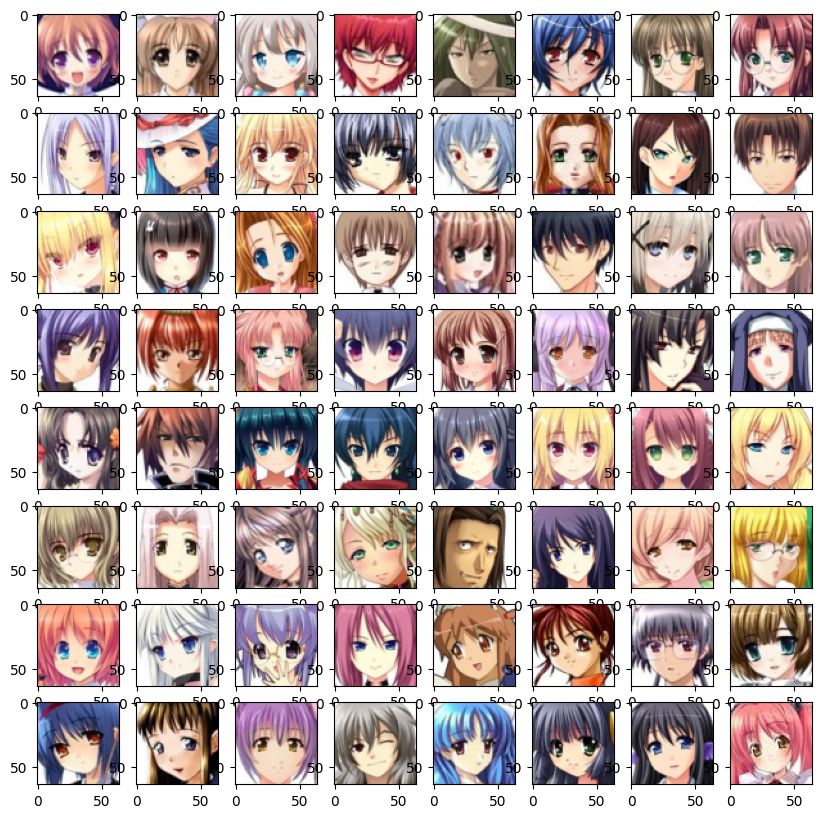

In [42]:
plot_image_batch(real_batch)

## **Generator and Discriminator**


### **Building the Generator**
The Generator is comprised of several layers of transposed convolution, the opposite of convolution operations.

- Each Conv2DTranspose layer (except the final layer) is followed by a Batch Normalization layer and a **Relu activation**
- The final transpose convolution layer has three output channels since the output needs to be a color image. We use the **Tanh activation** in the final layer.

<center><img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0XCEEN/images/generator.png" alt="generator image" width="80%"></center>


We build the Generator network by using the parameter values from <a href="https://learnopencv.com/deep-convolutional-gan-in-pytorch-and-tensorflow/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkGuidedProjectsIBMGPXX0A52EN3517-2023-01-01" >[3]<a>.

Each block (Block 1 to Block 5) consists of the following layers:
- `nn.ConvTranspose2d` : This layer performs the **convolutional transpose operation**, which effectively "***upscales***" the input.
  - It **increases the spatial resolution while reducing the number of channels**.
  - The parameters for this layer include the number of **input channels, the number of output channels, kernel size, stride, and padding**.

- `nn.BatchNorm2d`: Batch normalization is applied after each convolutional transpose layer.
  - It helps **stabilize and accelerate training by normalizing the activations.**

- `nn.ReLU` : A **rectified linear unit (ReLU)** activation function is applied after batch normalization, **introducing non-linearity to the model.**

- The final block, **Block 5, produces the generator's output** with the following layers:
  - `nn.ConvTranspose2d`: This layer **reduces the number of channels to 3**, which corresponds to the **number of color channels (RGB)** in the output image.
  - `nn.Tanh`: The **Tanh activation function** is applied to ensure that the **pixel values in the output image are in the range [-1, 1]**, which is common in image generation.

In [45]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()

    self.main = nn.Sequential(
      # Block 1: input is Z, going into a convolution
      nn.ConvTranspose2d(latent_vector_size, 64 * 8, 4, 1, 0, bias=False),
      nn.BatchNorm2d(64 * 8),
      nn.ReLU(True),

      # Block 2: input is (64 * 8) x 4 x 4
      nn.ConvTranspose2d(64 * 8, 64 * 4, 4, 2, 1, bias=False),
      nn.BatchNorm2d(64 * 4),
      nn.ReLU(True),

      # Block 3: input is (64 * 4) x 8 x 8
      nn.ConvTranspose2d(64 * 4, 64 * 2, 4, 2, 1, bias=False),
      nn.BatchNorm2d(64 * 2),
      nn.ReLU(True),

      # Block 4: input is (64 * 2) x 16 x 16
      nn.ConvTranspose2d(64 * 2, 64, 4, 2, 1, bias=False),
      nn.BatchNorm2d(64),
      nn.ReLU(True),

      # Block 5: input is (64) x 32 x 32
      nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
      nn.Tanh()

      # Output: output is (3) x 64 x 64
    )

  def forward(self, input):
    output = self.main(input)
    return output

In [46]:
latent_vector_size=128

G = Generator().to(device)
print(G)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


### **Building the Discriminator**
The Discriminator has five convolution layers.

- All but the first and final Conv2D layers have Batch Normalization, since directly applying batchnorm to all layers could result in sample oscillation and model instability;
- The first four Conv2D layers use the **Leaky-Relu activation** with a slope of 0.2.
- Lastly, instead of a fully connected layer, the  output layer has a convolution layer with a **Sigmoid activation** function.

In [47]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()

    self.main = nn.Sequential(
      # Block 1: input is (3) x 64 x 64
      nn.Conv2d(3, 64, 4, 2, 1, bias=False),
      nn.LeakyReLU(0.2, inplace=True),

      # Block 2: input is (64) x 32 x 32
      nn.Conv2d(64, 64 * 2, 4, 2, 1, bias=False),
      nn.BatchNorm2d(64 * 2),
      nn.LeakyReLU(0.2, inplace=True),

      # Block 3: input is (64*2) x 16 x 16
      nn.Conv2d(64 * 2, 64 * 4, 4, 2, 1, bias=False),
      nn.BatchNorm2d(64 * 4),
      nn.LeakyReLU(0.2, inplace=True),

      # Block 4: input is (64*4) x 8 x 8
      nn.Conv2d(64 * 4, 64 * 8, 4, 2, 1, bias=False),
      nn.BatchNorm2d(64 * 8),
      nn.LeakyReLU(0.2, inplace=True),

      # Block 5: input is (64*8) x 4 x 4
      nn.Conv2d(64 * 8, 1, 4, 1, 0, bias=False),
      nn.Sigmoid(),
      nn.Flatten()
      # Output: 1
    )

  def forward(self, input):
    output = self.main(input)
    return output

In [48]:
D =Discriminator().to(device)
print(D)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
    (13): Flatten(start_dim=1, end_d

## **Defining Loss Functions**

As we discussed in the previous section, the min-max optimization problem can be formulated by **minimizing the cross-entropy loss for the Generator and Discriminator**.

## **Defining Optimizers**

We create **two Adam optimizers for the discriminator and the generator**, respectively. We pass the following arguments to the optimizers:

- **learning rate of 0.0002**.
- beta coefficients **$\beta_1 = 0.5$ and $\beta_2 = 0.999$**, which are **responsible for computing the running averages of the gradients during backpropagation**.

## **Defining Learning Rate Scheduler - StepLR**
The learning rate scheduler is a **feature provided by the PyTorch** library. It **allows for the adjustment of the learning rate of an optimizer at specific intervals or epochs during the training** process.

- **optimizer**: The **optimizer object** for which the learning rate will be adjusted.
- **step_size**: The **number of epochs** after which the learning rate will be decreased.
- **gamma**: The **factor by which the learning rate will be multiplied**.

During training, you can update the learning rate by calling the `step()` method of the scheduler at the end of each epoch.


In [49]:
learning_rate = 0.0002
G_optimizer = optim.Adam(G.parameters(), lr = learning_rate, betas=(0.5, 0.999))
D_optimizer = optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5, 0.999))
scheduler_G = lr_scheduler.StepLR(G_optimizer, step_size=10, gamma=0.1)
scheduler_D = lr_scheduler.StepLR(D_optimizer, step_size=10, gamma=0.1)
device

device(type='cpu')

## **Initializing weights and biases**

In [50]:
# initializes the weights and biases of neural network layers based on the layer type.
# takes single arg --> m => module / layer of NN
def weights_init(m):
  # checks the type of the layer by examining its class name
  classname = m.__class__.__name__

  # if it is identified as a convolutional layer (Conv2d or ConvTranspose2d), and its weights are initialized using a normal distribution with a
  # mean of 0.0 and a standard deviation of 0.02.
  if classname.find('Conv') != -1:
    torch.nn.init.normal_(m.weight, 0.0, 0.02)

  # if it is identified as a batch normalization layer (BatchNorm2d), and its weights are initialized with a normal distribution having a
  # mean of 1.0 and a standard deviation of 0.02.
  # Additionally, the bias terms (if present) are set to zero using torch.nn.init.zeros_.
  elif classname.find('BatchNorm') != -1:
    torch.nn.init.normal_(m.weight, 1.0, 0.02)
    torch.nn.init.zeros_(m.bias)

D.apply(weights_init)
G.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

Here is a summary of what a train step accomplishes:

- First, we sample `z`, a batch of noise vectors from a normal distribution ($\mu = 1, \sigma = 1$) and feed it to the Generator.
- The Generator produces generated or "fake" images `xhat`.
- We feed real images `X` and fake images `xhat` to the Discriminator and obtain `real_output` and `fake_output` respectively as the scores.
- We calculate Generator loss `gen_loss` using the `fake_output` from Discriminator since we want the fake images to fool the Discriminator as much as possible.
- We calculate Discriminator loss `disc_loss` using both the `real_output` and `fake_output` since we want the Discriminator to distinguish the two as much as possible.
- We calculate `gradients_of_generator` and  `gradients_of_discriminator` based on the losses obtained.
- Finally, we update the Generator and Discriminator by letting their respective optimizers apply the processed gradients on the trainable model parameters.

We can transform the random noise using the generator. As the generator is not trained yet, the output appears to be noises:

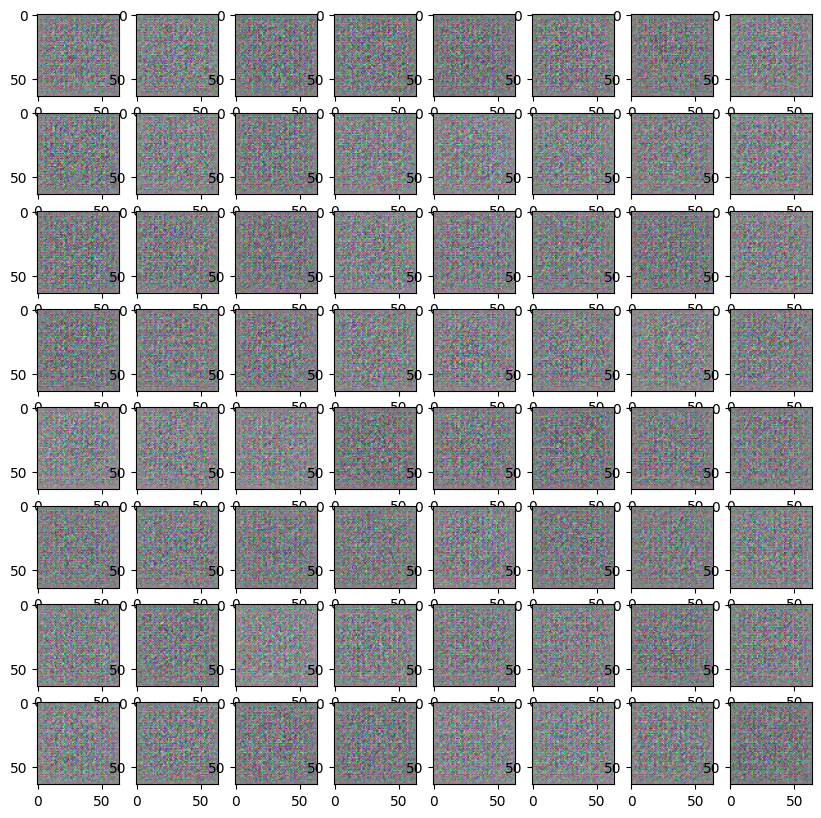

In [52]:
noise = torch.randn(batch_size , latent_vector_size, 1, 1, device=device)
Xhat = G(noise).detach()
plot_image_batch(Xhat)

## **Training DCGANs**

As this method is computationally intensive, we will train the model for one epoch and then use the generator to produce artificial images.

__Even 1 epoch in DCGANs training takes long time.__ You can __stop the training__ here and import the pre-trained model following the instruction below.

In [53]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define hyperparameters
LOSS_G = []
LOSS_D = []
epochs = 1
epsilon = 100

# Training loop
for epoch in tqdm(range(epochs)):
  print(epoch)
  for real_data in dataloader:
    real_data = real_data.to(device)
    noise =torch.randn(batch_size  , latent_vector_size , 1, 1, device=device)
    fake_data = G(noise)

    # Discriminator predictions for real and fake data
    real_predictions = D(real_data)
    fake_predictions = D(fake_data)

    # Discriminator loss for real and fake data
    loss_D_real = criterion(real_predictions, torch.ones(len(real_predictions), 1).to(device))
    loss_D_fake = criterion(fake_predictions, torch.zeros(len(fake_predictions), 1).to(device))

    # Overall discriminator loss
    loss_D = (loss_D_fake + loss_D_real) / 2
    LOSS_D.append(loss_D.detach().item())

    # Backpropagation and optimizer update for discriminator
    D.zero_grad()
    loss_D.backward(retain_graph=True)
    D_optimizer.step()

    # Training the generator
    output = D(fake_data)
    loss_G = criterion(output, torch.ones(len(output), 1).to(device))
    LOSS_G.append(loss_G.detach().item())

    # Backpropagation and optimizer update for generator
    G.zero_grad()
    loss_G.backward()
    G_optimizer.step()

  # Using LR Scheduler
  scheduler_G.step()
  scheduler_D.step()

  # Displaying Images
  Xhat = G(noise).to(device).detach()
  plot_image_batch(Xhat)
  print("Epoch:", epoch)

  # Saving the model
  torch.save(D.state_dict(), 'D.pth')
  torch.save(G.state_dict(), 'G.pth')

  0%|          | 0/1 [00:00<?, ?it/s]

0


  0%|          | 0/1 [07:16<?, ?it/s]


KeyboardInterrupt: ignored

Stopped running of above cell because taking long time

Load the pre-trained generator:

In [54]:
D = Discriminator()
D.load_state_dict(torch.load("D_trained.pth", map_location=torch.device('cpu')))
G = Generator()
G.load_state_dict(torch.load("G_trained.pth", map_location=torch.device('cpu')))

<All keys matched successfully>

Generating several images using the fully trained Generator and display them:

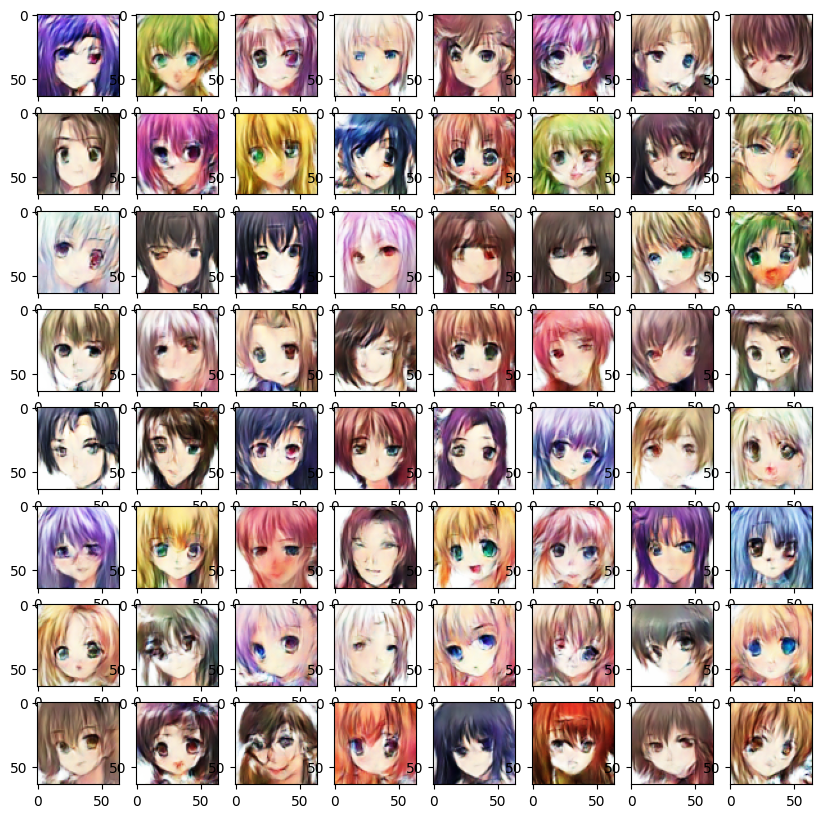

In [56]:
latent_vector_size=128
z = torch.randn(batch_size, latent_vector_size, 1, 1)

Xhat = G(z).detach()
plot_image_batch(Xhat)

## **Exploring latent variables**

### **Exercise 1**

Plot the generated images by the Generator with the following steps -

- Iterate over the values in the list [1, 0.8, 0.6, 0.4] using a variable **`c`**.
- Inside the loop, generate a random tensor **`z`** using **`torch.randn(batch_size, latent_vector_size, 1, 1)`** . The size of the tensor is determined by the values of **`batch_size`** and **`latent_vector_size`**.
- Print the value of **`c`** using the statement **`print("the value of c is ", c)`**.
- Calculate **`Xhat`** by multiplying **`c`** with **`z`** and passing the result to a function **`G()`** . The **`detach()`** method is used to detach **`Xhat`** from the computation graph.
- Call the **`plot_image_batch()`** function, passing **`Xhat`** as an argument. This function likely plots the batch of images represented by **`Xhat`**.
- Repeat the steps above for each value in the list [1, 0.8, 0.6, 0.4].

C:  1


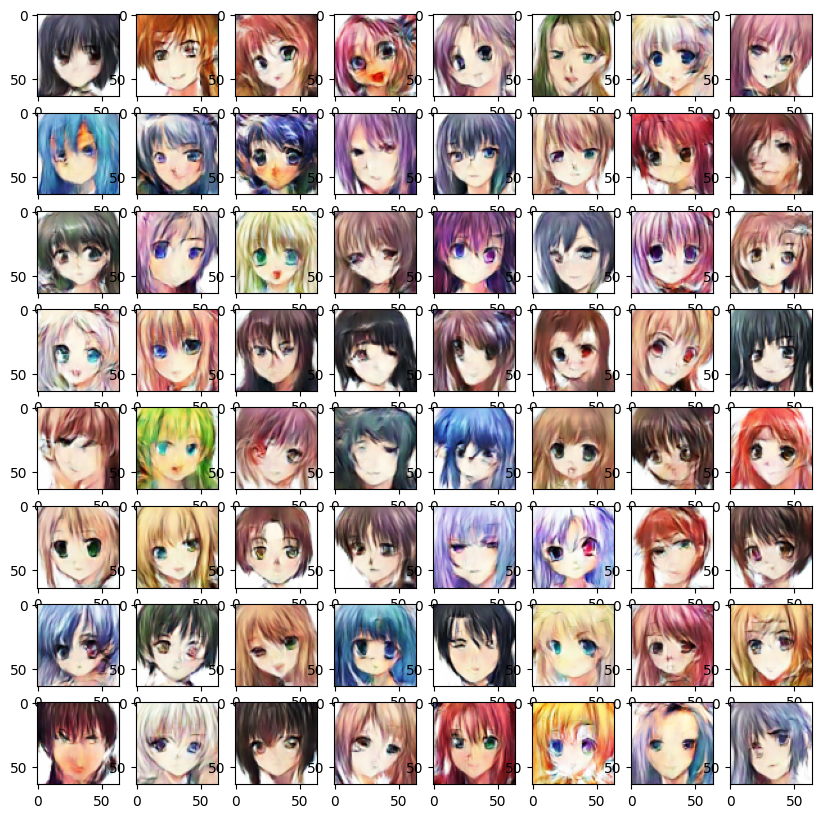

C:  0.8


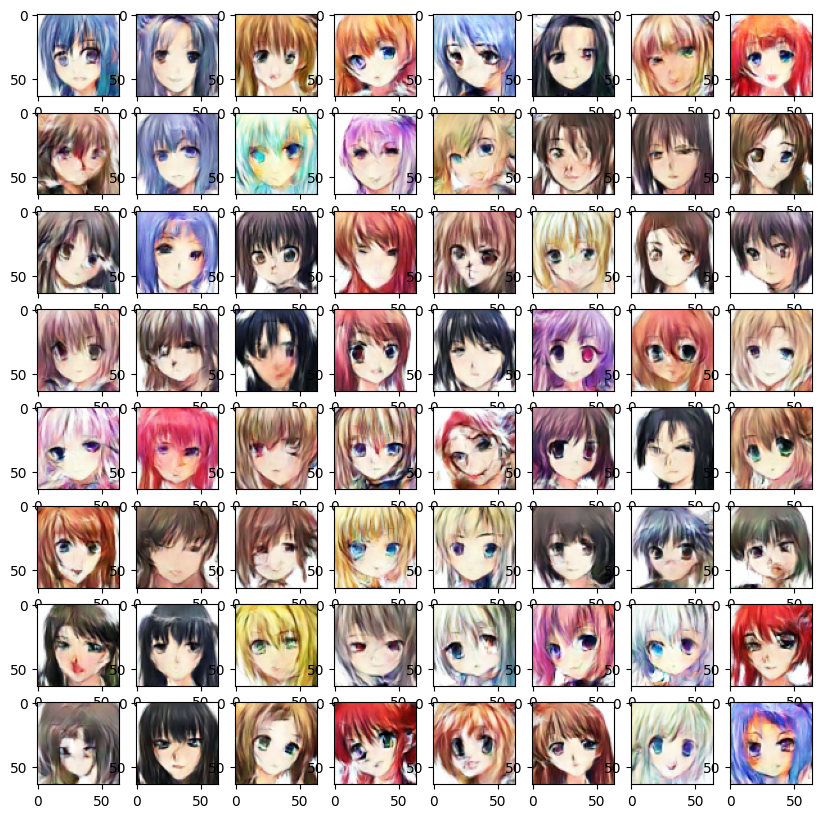

C:  0.6


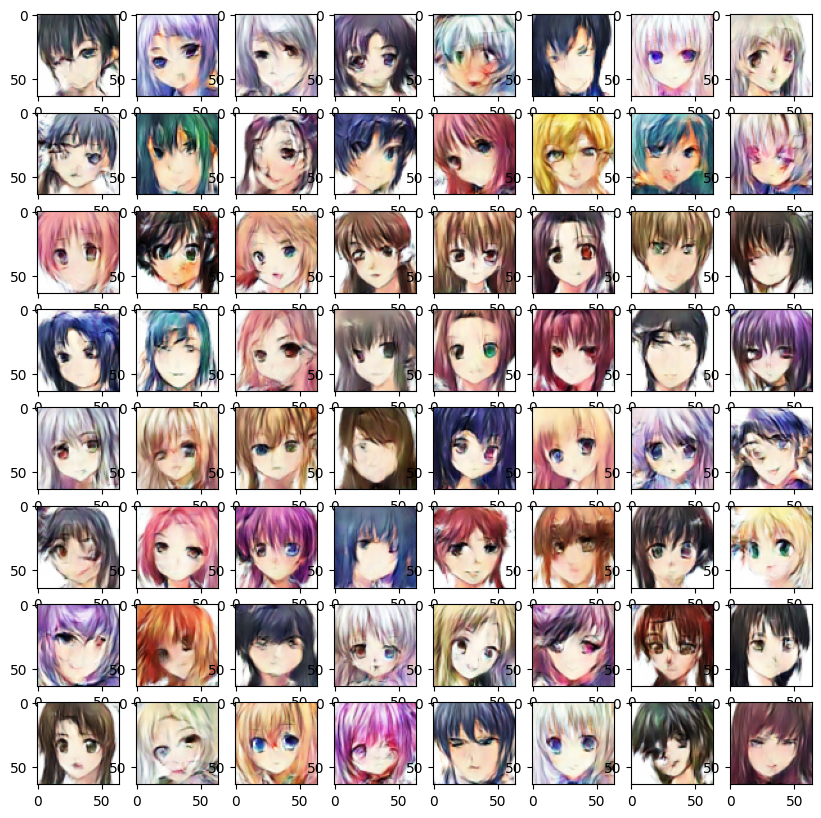

C:  0.4


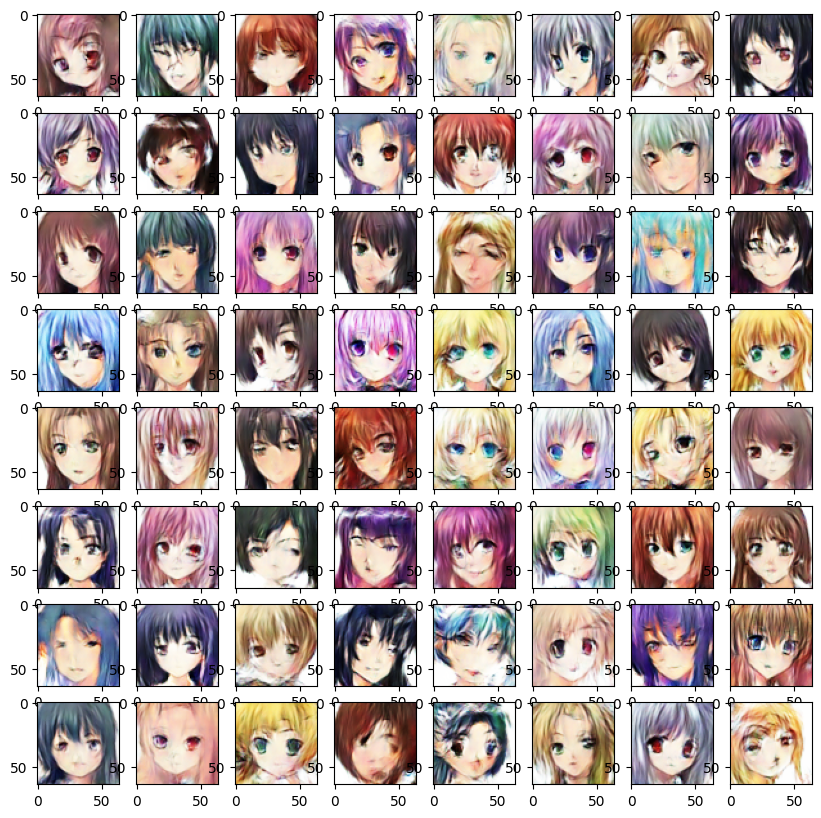

In [58]:
for c in [1, 0.8, 0.6, 0.4]:
  z = torch.randn(batch_size, latent_vector_size, 1, 1)
  print("C: ", c)

  Xhat = G(c*z).detach()
  plot_image_batch(Xhat)

### **Exercise 2**
Set the latent variable $z[0, 0:10*n, 0, 0] = -0.5*n$ each time `for n in range(5)`and see how the characteristics change. Follow the instructions
- Set the desired seed value to ensure reproducibility of random number generation **`seed_value = 42`**.
- Set the seed for generating random numbers using the **`torch.manual_seed()`** function from PyTorch.
- Generate a random noise vector 'z' using **`torch.randn()`**.
- Create an instance of the **`ToPILImage`** class to convert the generated image to a PIL Image object.
- Start a loop that iterates 5 times.
- Modify elements of **`z`** by setting a portion of elements from $z[0, 0:10*n, 0, 0] = -0.5*n$.
- Generate an image with the modified **`z`** by passing it to the generator model **`G`** . The result is stored in **`Xhat`**.
- Normalize the generated image by scaling it to the range [0, 1].
- Display the generated image using **`plt.imshow()`** and **`plt.show()`** to visualize the result.

Elements from 0 to 0 is set to -1


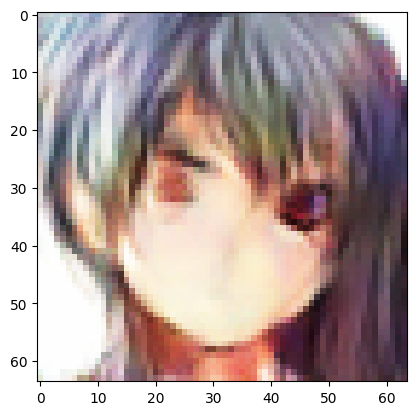

Elements from 0 to 10 is set to -1


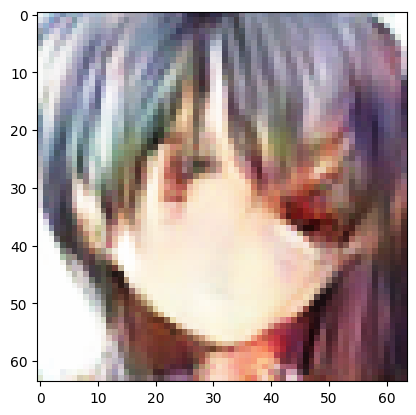

Elements from 0 to 20 is set to -1


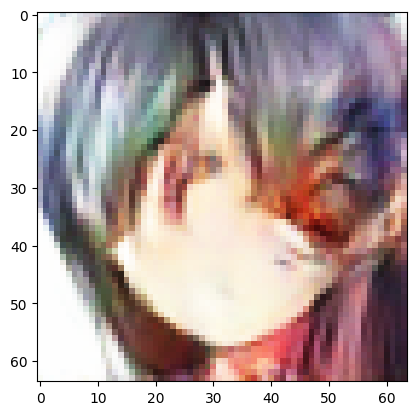

Elements from 0 to 30 is set to -1


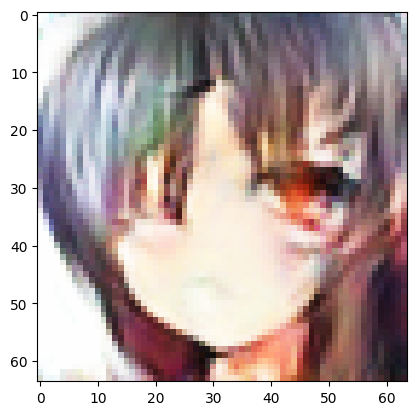

Elements from 0 to 40 is set to -1


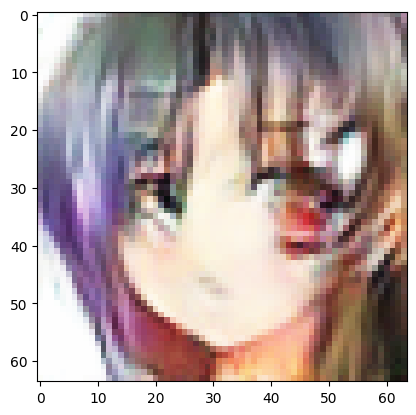

In [59]:
seed_value = 42

# Set the seed for generating random numbers
torch.manual_seed(seed_value)

# Generate a random noise vector 'z'
z = torch.randn(1, latent_vector_size, 1, 1)

# Create an instance of the 'ToPILImage' class
to_pil_image = ToPILImage()

for n in range(5):

  # Modify elements of 'z'
  z[0, 0:10*n, 0, 0]= -0.5*n

  # Generate an image with the modified 'z'
  Xhat=G(z).detach().squeeze(0)

  # Normalize the generated image
  Xhat = (Xhat + 1) / 2

  print("Elements from 0 to {} is set to -1".format(10*n))
  plt.imshow(to_pil_image(Xhat))
  plt.show()

We can also hold some of the elements of  𝐳 constant and randomly change others. Here, we set the first 20 elements to one and randomly change the rest. We see that all through the images, the hair color remains same but characteristics change.

### **Exercise 3**

Repeat the procedure above, but set the elements of $\mathbf{z}$ from index 0 to 35 to -1. The character will change completely by the end.

elements from 0 to 0 is set to -1


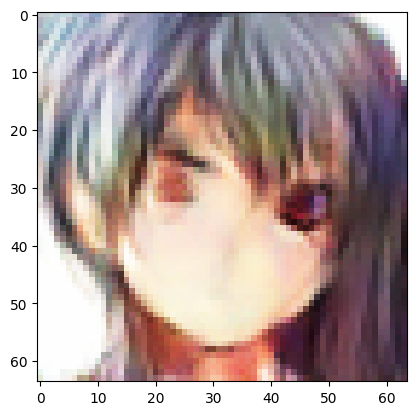

elements from 0 to 10 is set to -1


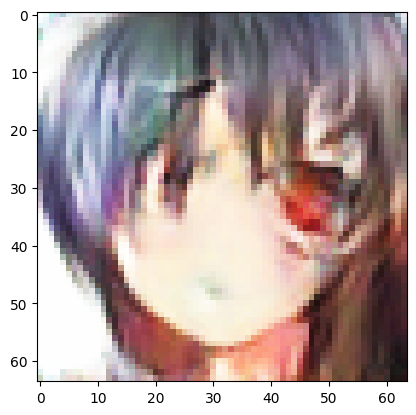

elements from 0 to 20 is set to -1


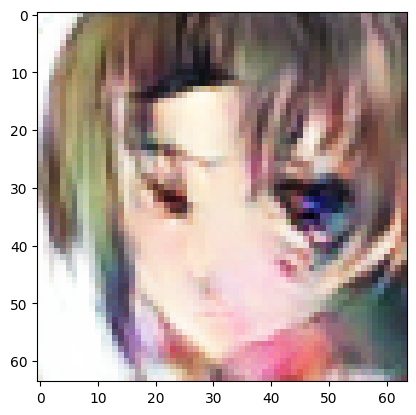

elements from 0 to 30 is set to -1


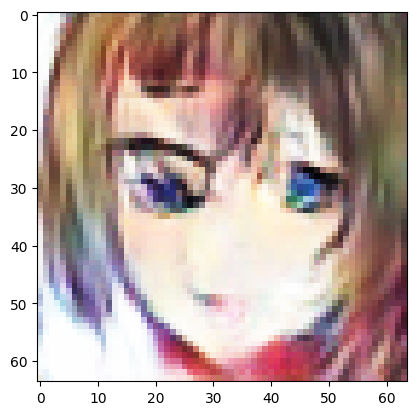

elements from 0 to 40 is set to -1


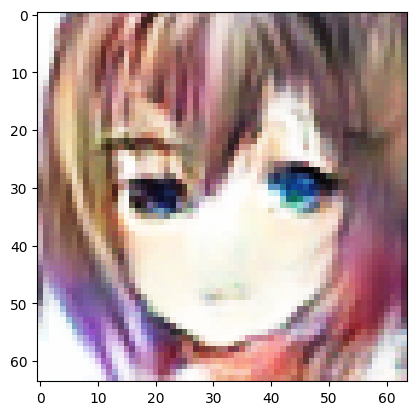

In [60]:
# Set the desired seed value
seed_value = 42

# Set the seed for generating random numbers
torch.manual_seed(seed_value)

# Generate a random noise vector 'z'
z = torch.randn(1, latent_vector_size, 1, 1)

# Create an instance of the 'ToPILImage' class
to_pil_image = ToPILImage()
for n in range(5):

  # Modify elements of 'z'
  z[0, 0:35*n, 0, 0]= -1

  # Generate an image with the modified 'z'
  Xhat=G(z).detach().squeeze(0)

  # Normalize the generated image
  Xhat = (Xhat + 1) / 2

  print("elements from 0 to {} is set to -1".format(10*n))
  plt.imshow(to_pil_image(Xhat))
  plt.show()